In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC  
from sklearn.svm import LinearSVC
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score,roc_curve
import warnings
warnings.filterwarnings("ignore")
!pip install imbalanced-learn

     -------------------------------------- 199.1/199.1 KB 6.1 MB/s eta 0:00:00


In [4]:
df=pd.read_csv("creditcard.csv")

In [13]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [16]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


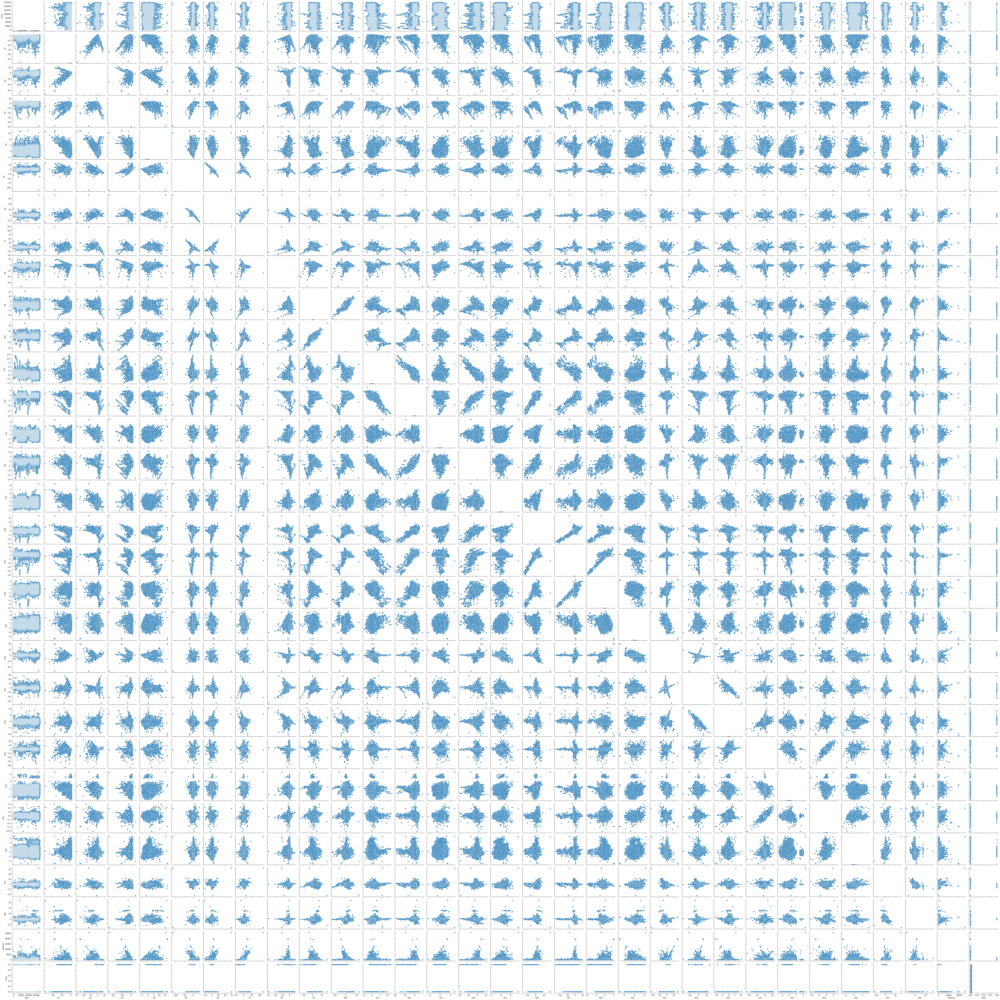

In [10]:
sns.pairplot(df)

In [17]:
df[df['Class'] == 1]['Class'].count()

492

<AxesSubplot:>

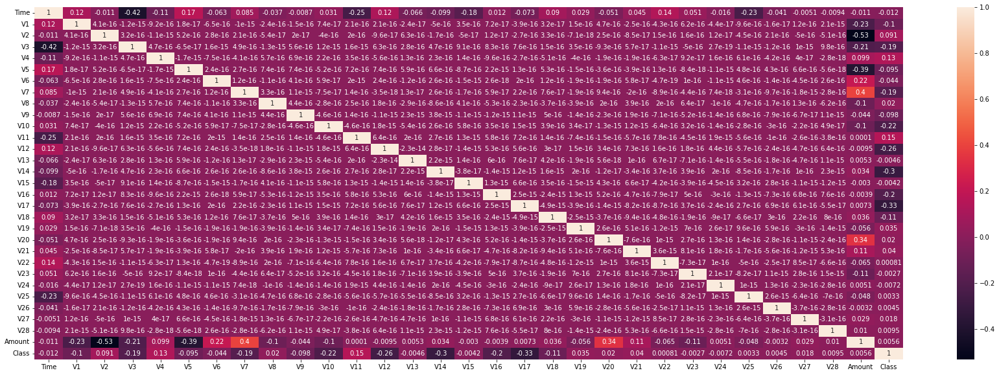

In [7]:
plt.figure(figsize=(30,10))
sns.heatmap(df.corr(),annot=True)

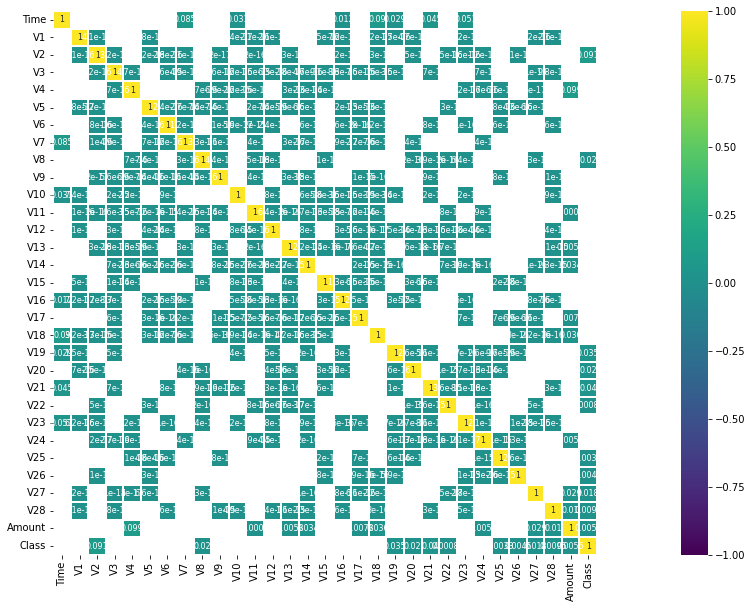

In [18]:
plt.figure(figsize=(30,10))
corrmat=df.corr()
sns.heatmap(corrmat[(corrmat >= 0.9) | (corrmat <= -0.6)|((corrmat <=0.1) & (corrmat >= 0))], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

In [8]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

V1


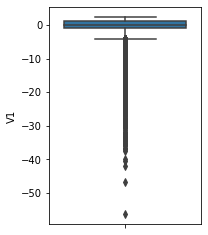

V2


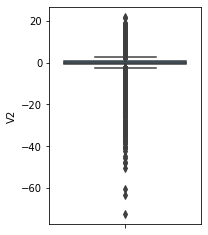

V3


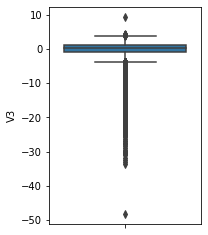

V4


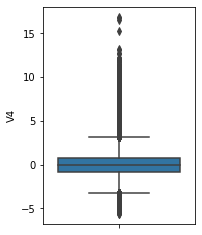

V5


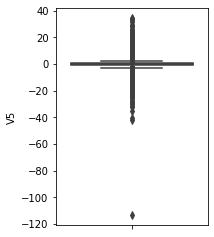

V6


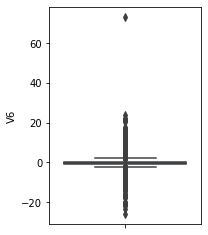

V7


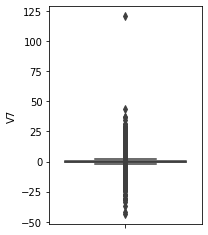

V8


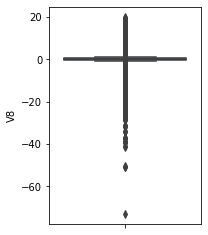

V9


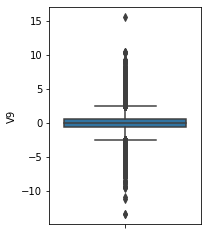

V10


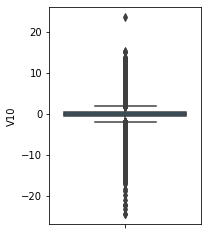

V11


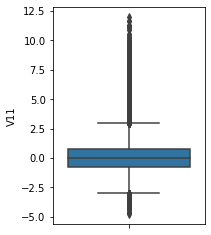

V12


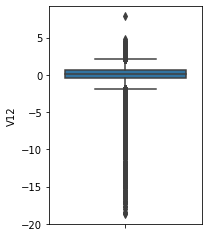

V13


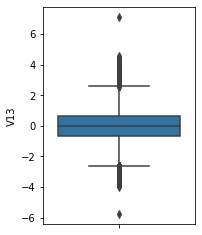

V14


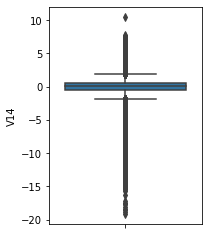

V15


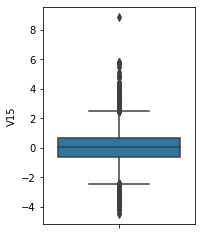

V16


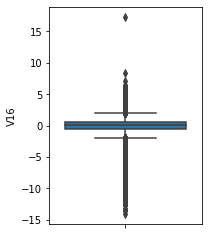

V17


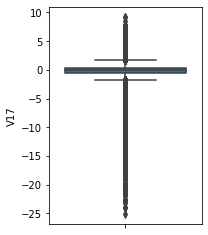

V18


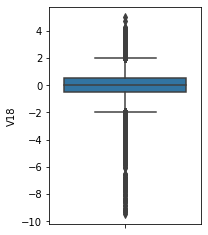

V19


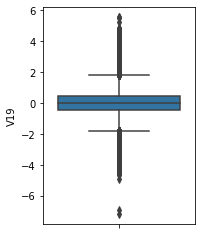

V20


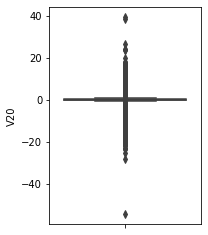

V21


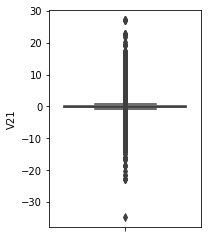

V22


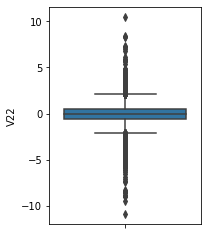

V23


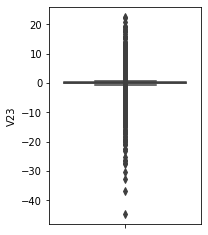

V24


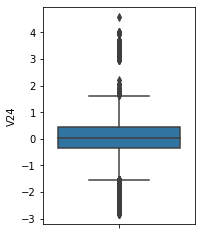

V25


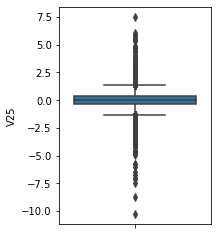

V26


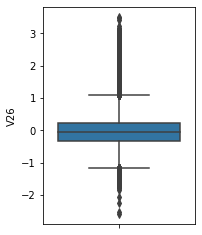

V27


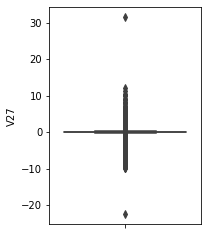

In [19]:

dataf=np.hsplit(df, [1,-3])[1]
#df=data.copy()
for i in dataf:
    print(i)
    plt.subplot(1,2,1)
    sns.boxplot(y=dataf[i])    
    plt.show()

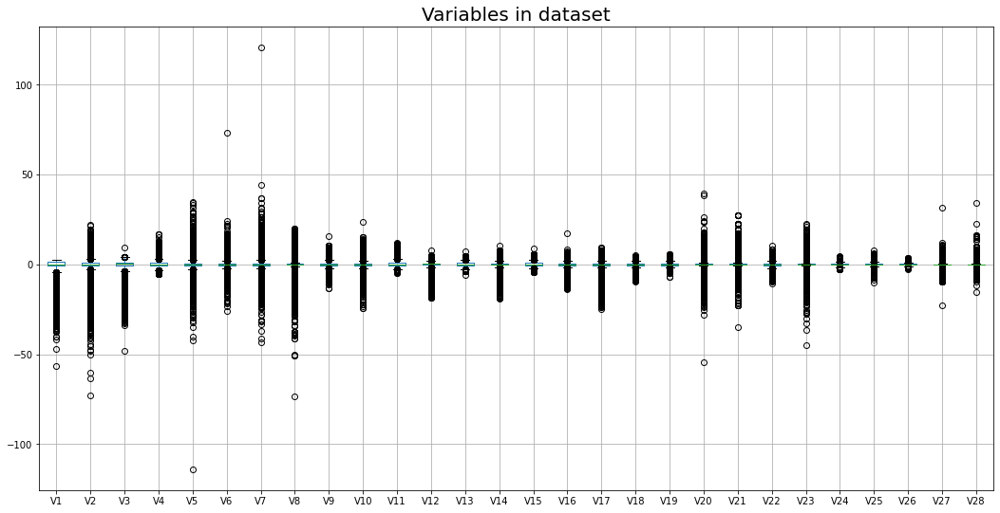

In [20]:
num_cols = np.array(df.columns[1:-2])
plt.figure(figsize=(18,9))
df[num_cols].boxplot()
plt.title("Variables in dataset", fontsize=20)
plt.show()

In [22]:
df.groupby(['Class']).count()
label=df.Class.value_counts().index
count=df.Class.value_counts().values

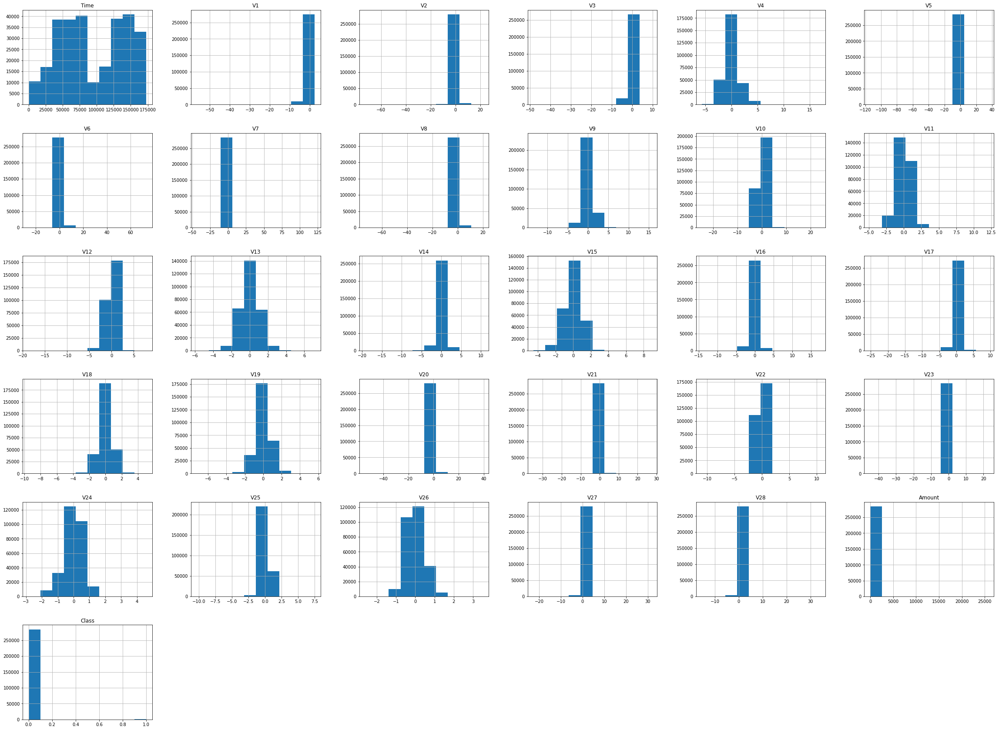

In [23]:
df.hist(figsize=(40,30))
plt.show()

(28,)


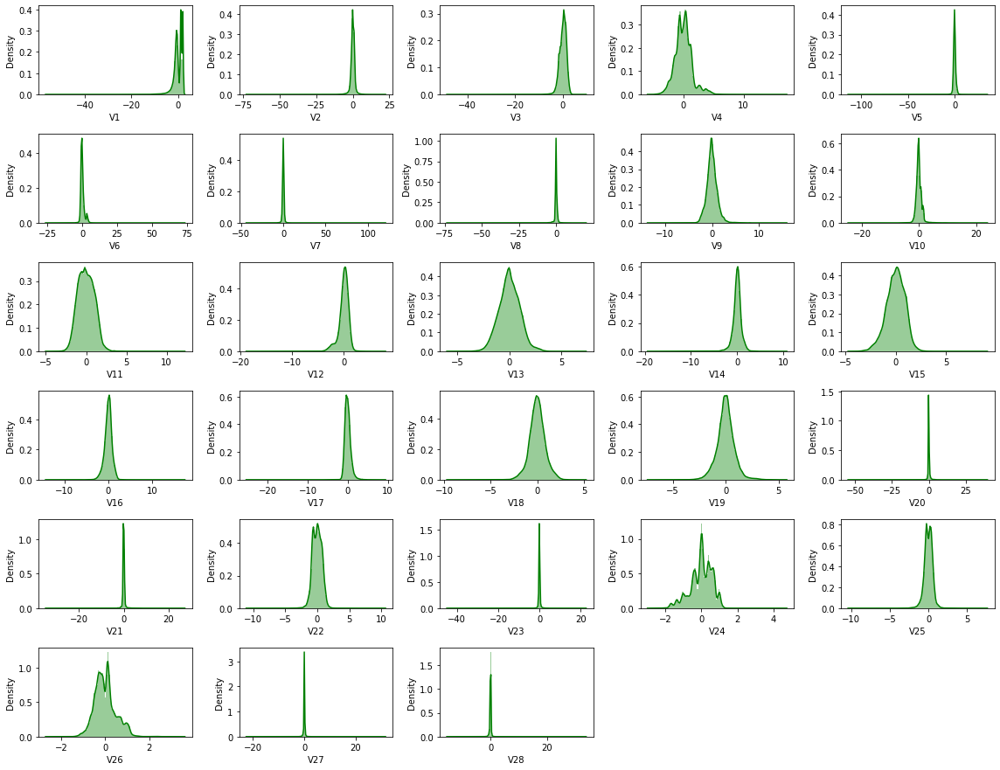

In [24]:
plt.figure(figsize=(16,16))
x=df.columns[1:-2]
print(x.shape)
for i in range(len(x)):
    plt.subplot(8,5,i+1)
    #print(i*2+j)
    sns.distplot(df[x[i]], color='g', bins=100, hist_kws={'alpha': 0.4})   
plt.tight_layout()
plt.show()

(28,)


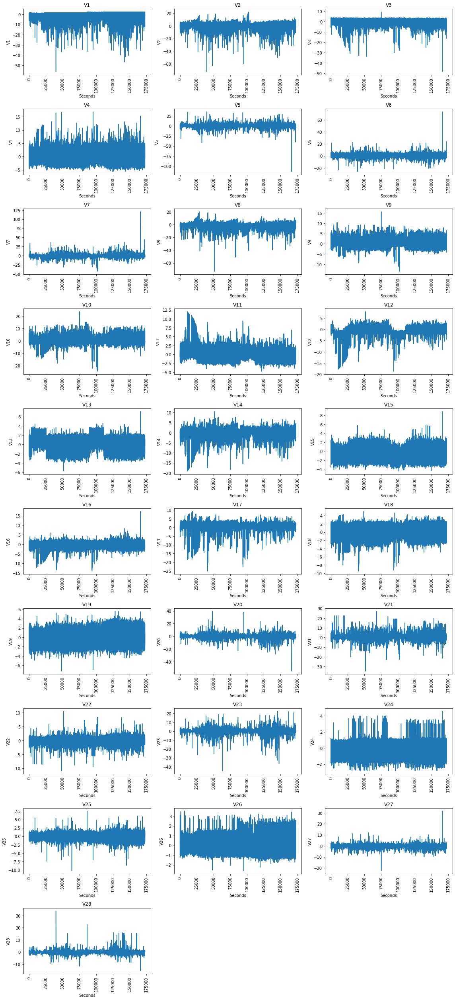

In [25]:
plt.figure(figsize=(16,35))
x=df.columns[1:-2]
print(x.shape)
for i in range(len(x)):
    plt.subplot(10,3,i+1)
    plt.plot(df["Time"],df[x[i]])  
    plt.ylabel(x[i])
    plt.title(x[i])
    plt.xticks(rotation=90)
    plt.xlabel("Seconds")

plt.tight_layout()
plt.show()

Hourly Resampling

In [26]:
df1=df.copy()
df1['Date']=pd.to_datetime(df1['Time'], unit='s')
df1

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Date
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,1970-01-01 00:00:00
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,1970-01-01 00:00:00
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,1970-01-01 00:00:01
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,1970-01-01 00:00:01
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,1970-01-01 00:00:02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0,1970-01-02 23:59:46
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0,1970-01-02 23:59:47
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0,1970-01-02 23:59:48
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0,1970-01-02 23:59:48


In [27]:
df2=df1.resample('H',on='Date').mean()
df2

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Date,,,,,,,,,,,,,,,,,,,,,
1970-01-01 00:00:00,1633.740348,-0.334018,0.308613,0.836005,0.010992,-0.028625,0.052939,0.146720,-0.071266,0.052013,...,0.010625,-0.082871,-0.058258,0.028789,0.095258,-0.011985,0.044817,0.002536,64.875566,0.000505
1970-01-01 01:00:00,4937.326116,-0.152240,0.250832,0.887425,0.329045,0.052089,0.444347,-0.222162,0.020867,1.091411,...,-0.146889,-0.308244,-0.001418,0.027629,0.077187,-0.078562,-0.015572,0.009408,65.902431,0.000902
1970-01-01 02:00:00,8979.689721,-0.510329,0.342518,1.055300,0.569409,-0.078404,0.061186,-0.160992,-0.201235,1.464427,...,-0.079515,-0.195433,-0.019192,0.016227,0.089923,0.158815,-0.003829,-0.012809,69.047697,0.013325
1970-01-01 03:00:00,12042.546403,-0.046475,0.255701,0.945031,0.451195,-0.143424,-0.056164,-0.219094,-0.073320,1.384205,...,-0.055153,-0.122113,-0.028961,0.017450,0.085369,0.440125,-0.031888,0.012373,51.788490,0.007139
1970-01-01 04:00:00,15699.726433,-0.094348,0.296404,0.926314,0.646666,-0.194601,0.356132,-0.249499,0.087166,1.380050,...,-0.108340,-0.116473,-0.013763,-0.019451,0.094979,0.238796,-0.010429,-0.001589,73.789852,0.005545
1970-01-01 05:00:00,19843.998215,-0.046993,0.211770,0.680716,0.160025,-0.376542,0.060224,-0.515255,0.074675,1.565640,...,-0.085218,-0.123714,-0.050481,-0.002713,0.234762,-0.258961,0.034097,-0.016800,45.880976,0.006544
1970-01-01 06:00:00,23380.892955,-0.330951,0.322974,0.616157,0.472035,-0.249861,0.067230,-0.301500,0.138331,1.353628,...,-0.122537,-0.216958,-0.047833,-0.020694,0.169109,-0.080924,0.034888,0.016364,77.773616,0.001638
1970-01-01 07:00:00,27181.714667,-0.323256,0.181363,0.502743,0.261562,-0.226661,-0.004589,-0.105708,0.129838,-0.242597,...,0.003370,-0.128693,-0.044993,0.022850,0.128370,0.041745,0.021020,0.025035,81.147856,0.006829
1970-01-01 08:00:00,30715.454142,-0.210966,0.030505,0.585781,0.110453,-0.327430,0.014595,-0.104180,0.051144,-0.218109,...,0.003309,-0.090303,-0.039037,0.001916,0.154308,-0.000421,0.006221,0.002211,90.707812,0.000965


In [28]:
df2=df2.set_index(df2 .index.strftime("%H:%M:%S"))
df2["Date"]=df2.index

In [29]:
df21=df2.iloc[:24,:]
df21
df22=df2.iloc[24:,:]
df22

df_concat=pd.concat((df21, df22))
by_row_index = df_concat.groupby(df_concat.index)
df2 = by_row_index.mean()
df2

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Date,,,,,,,,,,,,,,,,,,,,,
00:00:00,44792.131696,-0.170827,0.357211,0.107719,-0.140673,0.255981,-0.046062,0.258620,-0.099859,0.119115,...,0.033892,0.001086,-0.006269,0.033485,-0.004907,0.015111,0.053631,0.013721,60.185156,0.000788
01:00:00,48214.246433,0.010822,0.322148,0.300540,0.327165,0.286414,0.221427,-0.043145,-0.119772,1.265596,...,-0.100532,-0.211651,0.030071,0.004254,-0.046983,-0.034765,-0.008722,0.005995,62.461890,0.002448
02:00:00,52171.986128,-0.369608,0.417457,0.182888,0.520652,0.192413,-0.043276,-0.092992,-0.217217,1.443714,...,-0.061234,-0.050936,-0.012768,0.007798,0.032084,0.074740,-0.000803,0.004561,70.197795,0.016936
03:00:00,55215.634662,0.220979,0.190408,0.357528,0.410287,0.095262,0.009224,-0.196387,-0.143431,1.513531,...,-0.019063,-0.018000,0.024040,-0.006170,-0.067478,0.273616,-0.029045,0.007205,52.089733,0.004766
04:00:00,58880.383624,0.122943,0.218780,0.310599,0.557294,-0.001504,0.292920,-0.291085,-0.068352,1.484079,...,-0.075149,-0.039327,0.036587,-0.063743,-0.097749,0.160482,-0.024174,-0.007089,76.974167,0.010315
05:00:00,63034.130124,0.041824,0.239039,0.475815,0.170447,0.023899,0.020823,-0.168861,-0.063213,1.598251,...,-0.103357,-0.103105,-0.026360,-0.064193,0.067395,-0.291773,0.009957,-0.029776,51.356935,0.003272
06:00:00,66684.744935,0.036908,0.293419,0.242625,0.360677,0.110098,0.009407,-0.072216,-0.027151,1.424561,...,-0.091036,-0.090420,-0.018571,-0.032750,0.044850,-0.165942,0.019904,0.005260,66.289607,0.002141
07:00:00,70334.121463,0.134645,0.128681,-0.130480,0.096995,0.133301,-0.050973,0.048857,0.030288,-0.075985,...,0.060930,0.085569,-0.012126,0.049471,0.031735,-0.017800,0.028666,0.017501,68.690460,0.003414
08:00:00,73912.488009,0.098812,-0.047311,-0.009014,-0.073327,-0.007520,-0.019298,0.017427,-0.038458,-0.117492,...,0.042082,0.037766,-0.001681,-0.004227,0.009236,-0.009514,0.002532,0.002153,88.755665,0.000875


(28,)


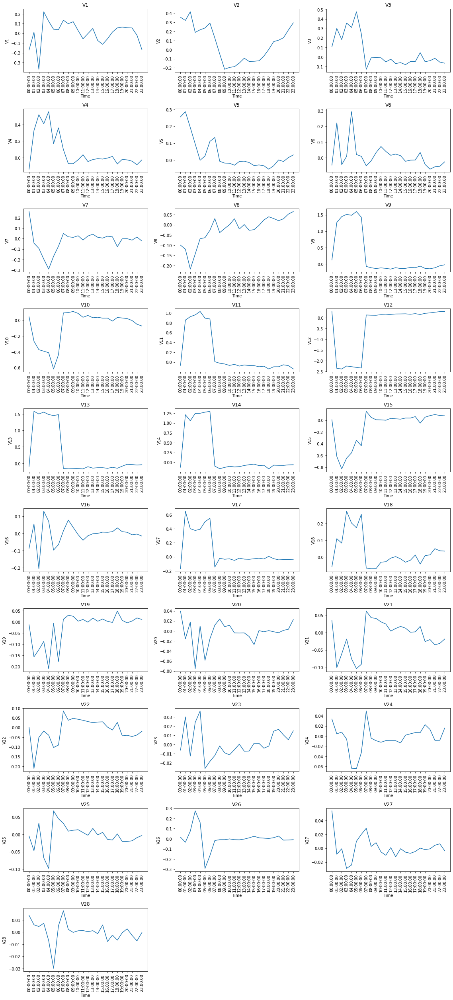

In [30]:
plt.figure(figsize=(16,35))
x=df2.columns[1:-2]
print(x.shape)
for i in range(len(x)):
    plt.subplot(10,3,i+1)
    #print(i*2+j)
    #sns.distplot(df[x[i]], color='g', bins=100, hist_kws={'alpha': 0.4}) 
    plt.plot(df2.index,df2[x[i]])  
    plt.ylabel(x[i])
    plt.title(x[i])
    plt.xticks(rotation=90)
    plt.xlabel("Time")
plt.tight_layout()
plt.show()

ML Algorithms and Visualization

In [31]:
df=pd.read_csv("creditcard.csv")
X = df.drop("Class",axis=1)
y = df.loc[:,['Class']]

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [33]:
from sklearn.preprocessing import StandardScaler    
sc= StandardScaler()    
X_train= sc.fit_transform(X_train)    
X_test= sc.transform(X_test)    

In [34]:
def svm_classifier(X_train,y_train,X_test,y_test):
  svm = LinearSVC()
  #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 28)
  %time svm.fit(X_train, y_train)
  print('Training Accuracy: ',svm.score(X_train, y_train))
  print('Test Accuracy: ',svm.score(X_test, y_test))
  y_pred = svm.predict(X_test)
  plot_confusion_matrix(svm, X_test, y_test)  
  plt.title('Confusion Matrix')
  plt.show()
  print()
  print(classification_report(y_test, y_pred))

Wall time: 1min 40s
Training Accuracy:  0.9993548245517786
Test Accuracy:  0.9992977774656788


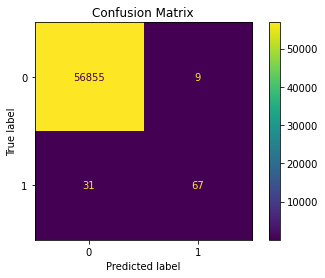


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.68      0.77        98

    accuracy                           1.00     56962
   macro avg       0.94      0.84      0.88     56962
weighted avg       1.00      1.00      1.00     56962



In [35]:
svm_classifier(X_train,y_train,X_test,y_test)

In [36]:
from sklearn.ensemble import RandomForestClassifier
def rf_classifier(X_train,y_train,X_test,y_test):
  clf= RandomForestClassifier(n_estimators= 10, criterion="entropy")  
  #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 28)
  %time clf.fit(X_train, y_train) 
  print('Training Accuracy: ',clf.score(X_train, y_train))
  print('Test Accuracy: ',clf.score(X_test, y_test))
  y_pred= clf.predict(X_test) 
  plot_confusion_matrix(clf, X_test, y_test)  
  plt.title('Confusion Matrix')
  plt.show()
  print()
  print(classification_report(y_test, y_pred))

Wall time: 25.7 s
Training Accuracy:  0.9999297768219623
Test Accuracy:  0.9995786664794073


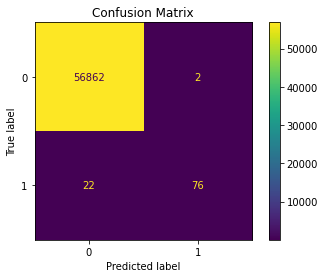


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.97      0.78      0.86        98

    accuracy                           1.00     56962
   macro avg       0.99      0.89      0.93     56962
weighted avg       1.00      1.00      1.00     56962



In [37]:
rf_classifier(X_train,y_train,X_test,y_test)

Under Sampling

In [40]:
from imblearn.under_sampling import RandomUnderSampler
rus=RandomUnderSampler(random_state=4)
X_train_under_sampling, y_train_under_sampling = rus.fit_resample(X_train, y_train)

In [41]:
y_train_under_sampling.value_counts()

Class
0        394
1        394
dtype: int64

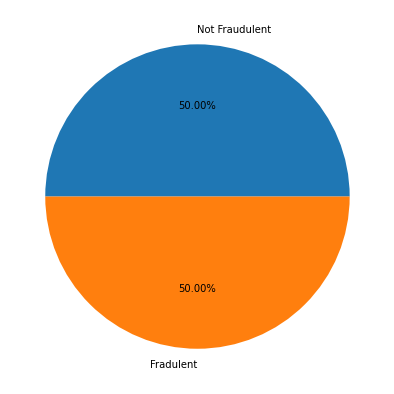

In [42]:
label=y_train_under_sampling.value_counts().index
count=y_train_under_sampling.value_counts().values
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels =["Not Fraudulent","Fradulent"],autopct='%1.2f%%')
plt.show()

Wall time: 50.8 ms
Training Accuracy:  0.9517766497461929
Test Accuracy:  0.9645377620167831


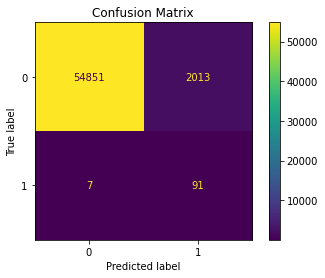


              precision    recall  f1-score   support

           0       1.00      0.96      0.98     56864
           1       0.04      0.93      0.08        98

    accuracy                           0.96     56962
   macro avg       0.52      0.95      0.53     56962
weighted avg       1.00      0.96      0.98     56962



In [43]:
svm_classifier(X_train_under_sampling,y_train_under_sampling,X_test,y_test)

Wall time: 131 ms
Training Accuracy:  0.9923857868020305
Test Accuracy:  0.9729117657385625


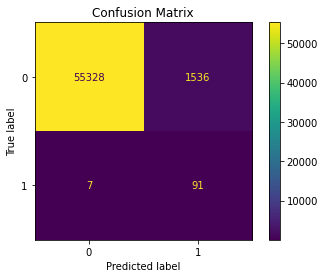


              precision    recall  f1-score   support

           0       1.00      0.97      0.99     56864
           1       0.06      0.93      0.11        98

    accuracy                           0.97     56962
   macro avg       0.53      0.95      0.55     56962
weighted avg       1.00      0.97      0.98     56962



In [44]:
rf_classifier(X_train_under_sampling,y_train_under_sampling,X_test,y_test)

Over Sampling

In [45]:
from imblearn.over_sampling import SMOTE

In [46]:
sm=SMOTE(sampling_strategy=1, k_neighbors=5, random_state=7)
X_train_over_sampling, y_train_over_sampling = sm.fit_resample(X_train, y_train)

In [47]:
y_train_over_sampling.value_counts()

Class
0        227451
1        227451
dtype: int64

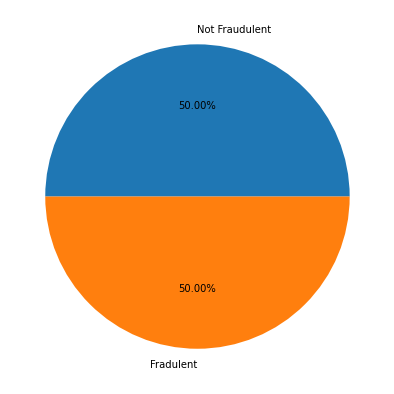

In [48]:
label=y_train_over_sampling.value_counts().index
count=y_train_over_sampling.value_counts().values
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels =["Not Fraudulent","Fradulent"],autopct='%1.2f%%')
plt.show()

Wall time: 3min 1s
Training Accuracy:  0.9467775476915907
Test Accuracy:  0.9790035462237984


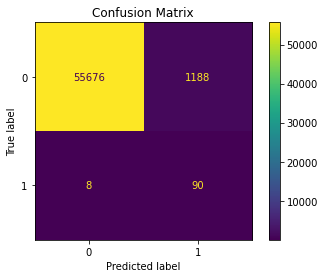


              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.07      0.92      0.13        98

    accuracy                           0.98     56962
   macro avg       0.54      0.95      0.56     56962
weighted avg       1.00      0.98      0.99     56962



In [49]:
svm_classifier(X_train_over_sampling,y_train_over_sampling,X_test,y_test)

Wall time: 39.5 s
Training Accuracy:  1.0
Test Accuracy:  0.9995611109160493


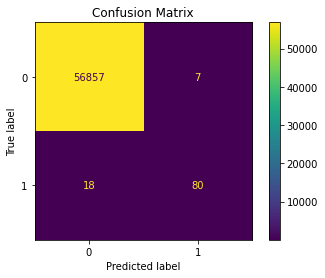


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.92      0.82      0.86        98

    accuracy                           1.00     56962
   macro avg       0.96      0.91      0.93     56962
weighted avg       1.00      1.00      1.00     56962



In [50]:
rf_classifier(X_train_over_sampling,y_train_over_sampling,X_test,y_test)